<a href="https://colab.research.google.com/github/kitzeslab/bioacoustics-cookbook/blob/main/SCB_tutorial_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SCB workshop tutorial OpenSoundscape
The first part of the tutorial involves installing OpenSoundscape on the machine running google colab. Don't worry about the messy error messages below - this is due to Google Colab already having a set of packages installed, and us asking it to install a new set! (`&> /dev/null` hides the gross errors)

In [ ]:
!pip install opensoundscape &> /dev/null

#install some useful packages
import numpy as np
from matplotlib import pyplot as plt

#set up plots to make nice big figures
plt.rcParams['figure.figsize']=[15,5]
%config InlineBackend.figure_format = 'retina'

/usr/local/lib/python3.7/dist-packages/resampy/interpn.py:114: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  _resample_loop_p(x, t_out, interp_win, interp_delta, num_table, scale, y)


## Lets load in the audio you just recorded on an audio moth
First we need to upload the audio so Google Colab can access it. After executing the cell below click the choose files button and find the audiomoth file to upload.

In [ ]:
from google.colab import files

uploaded = files.upload()
files = list(uploaded.keys())
filename = files[0]

Saving pa_soundscape_60s.wav to pa_soundscape_60s (1).wav


## Now we're going to 'import' OpenSoundscape
To make your code a bit easier to read, we also want to import specific functions and classes from OpenSoundscape. e.g. instead of having to type `opensoundscape.audio.spectogram.Spectrogram.from_file` every time we want to make a spectrogram from an audio file, if we first declare `from opensoundscape.spectrogram import Spectrogram` we can simply write `Spectrogram.from_audio` each time we want to make a spectrogram.

In [ ]:
import opensoundscape
from opensoundscape.audio import Audio
from opensoundscape.spectrogram import Spectrogram

Create an audio and specrogram object, then show the first 10 seconds as a specrtrogram

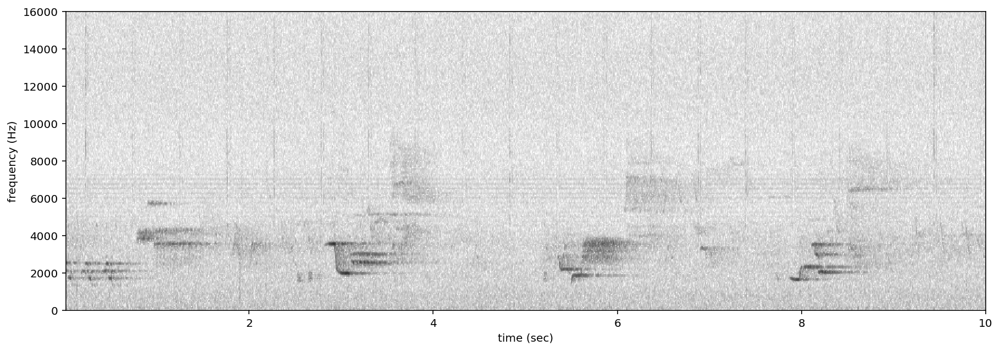

In [ ]:
audio = Audio.from_file(filename,sample_rate=32000)
spectrogram = Spectrogram.from_audio(audio)
spectrogram.trim(0,10).plot()

In [ ]:
import IPython
IPython.display.Audio(filename)

### Lets download a model we trained earlier!
To save some time we trained a model already. This model is a Convolutional Neural Network (CNN) trained to recognize spectrograms of 38 bird species. It will provide confidence scores of each species' presence for every 4 seconds of audio. 

This recognizer is far from perfect! We will explore how well it identifies bird vocalizations later on. 

In [ ]:
!wget https://pitt.box.com/shared/static/sbws0r6ce9osveozhvbpvy7gdc7r8hld.model -O trained.model &> /dev/null

In [ ]:
from opensoundscape.torch.models.cnn import load_model
model = load_model("trained.model")

Let's make predictions on the audio with our CNN!

To output scores that sum to 1 across the classes, we use the 'softmax' activation function. 


In [ ]:
preds, _, _ = model.predict([filename],activation_layer='softmax')
preds

[]


Red-winged Blackbird  \
file                  start_time end_time                         
pa_soundscape_60s.wav 0.0        5.0               3.206408e-19   
                      5.0        10.0              2.302720e-23   
                      10.0       15.0              6.341028e-17   
                      15.0       20.0              1.396340e-16   
                      20.0       25.0              1.476135e-12   
                      25.0       30.0              1.032185e-28   
                      30.0       35.0              1.734063e-25   
                      35.0       40.0              1.847788e-18   
                      40.0       45.0              1.324608e-10   
                      45.0       50.0              1.357679e-09   
                      50.0       55.0              1.817657e-09   
                      55.0       60.0              9.245119e-12   

                                           Tufted Titmouse  Cedar Waxwing  \
file                  start_time end_time                                   
pa_soundscape_60s.wav 0.0        5.0          1.844591e-18   3.310332e-22   
                      5.0        10.0         9.233494e-26   5.079614e-25   
                      10.0       15.0         7.200023e-12   3.044866e-14   
                      15.0       20.0         1.133121e-17   8.723202e-20   
                      20.0       25.0         2.490827e-12   1.283881e-12   
                      25.0       30.0         6.564883e-34   2.897506e-30   
                      30.0       35.0         2.897834e-25   1.150753e-27   
                      35.0       40.0         6.544933e-18   4.787160e-22   
                      40.0       45.0         9.592933e-13   7.443021e-13   
                      45.0       50.0         9.851901e-12   1.944989e-13   
                      50.0       55.0         1.328572e-09   2.567830e-12   
                      55.0       60.0         7.915141e-10   9.602947e-14   

                                           Canada Goose  Red-Shouldered Hawk  \
file                  start_time end_time                                      
pa_soundscape_60s.wav 0.0        5.0       1.244133e-19         1.586782e-23   
                      5.0        10.0      6.373861e-26         1.722225e-30   
                      10.0       15.0      9.948014e-18         2.946677e-20   
                      15.0       20.0      7.886140e-20         2.287880e-22   
                      20.0       25.0      4.009538e-15         1.450973e-15   
                      25.0       30.0      6.840593e-30         3.856630e-35   
                      30.0       35.0      7.589697e-28         1.805862e-29   
                      35.0       40.0      4.902917e-19         1.416880e-23   
                      40.0       45.0      1.662941e-15         5.759177e-15   
                      45.0       50.0      4.987775e-14         7.521342e-15   
                      50.0       55.0      1.481286e-13         5.218274e-14   
                      55.0       60.0      5.145693e-16         9.097360e-16   

                                           Northern Cardinal         Verry  \
file                  start_time end_time                                    
pa_soundscape_60s.wav 0.0        5.0            6.470857e-17  2.189622e-16   
                      5.0        10.0           1.619685e-21  1.220076e-23   
                      10.0       15.0           6.501741e-15  2.988197e-13   
                      15.0       20.0           9.139277e-12  3.621500e-15   
                      20.0       25.0           6.565030e-06  1.764858e-10   
                      25.0       30.0           2.885618e-28  2.327813e-29   
                      30.0       35.0           1.570446e-21  3.257925e-24   
                      35.0       40.0           1.197282e-14  4.467519e-16   
                      40.0       45.0           3.765408e-01  2.735711e-10   
                      45.0       50.0         

Examine the spectrograms and corresponding Wood Thrush scores (first 10)

score for Wood Thrush class [0-1]: 1.000


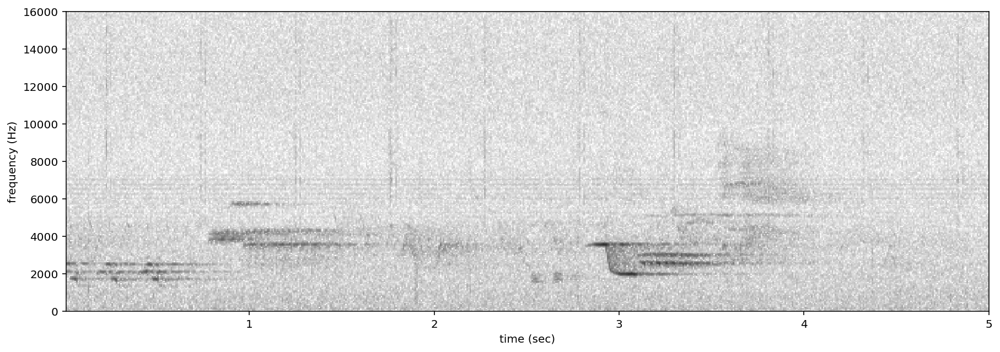

score for Wood Thrush class [0-1]: 1.000


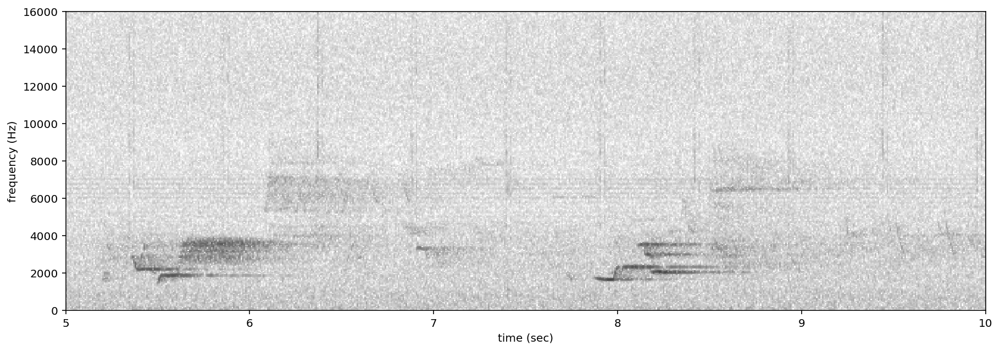

score for Wood Thrush class [0-1]: 1.000


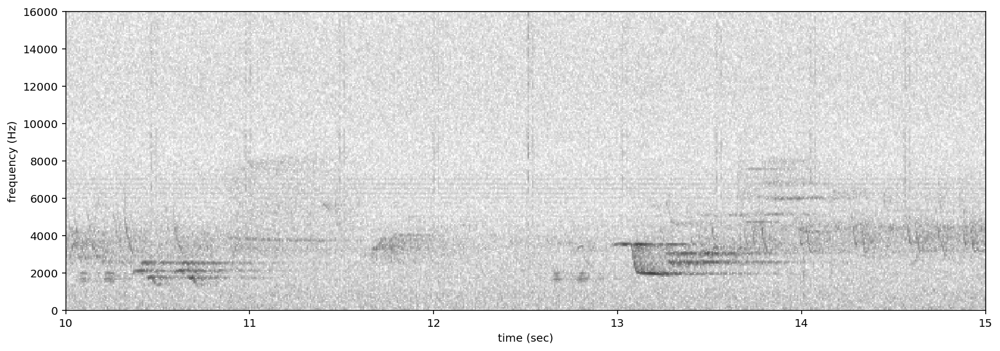

score for Wood Thrush class [0-1]: 1.000


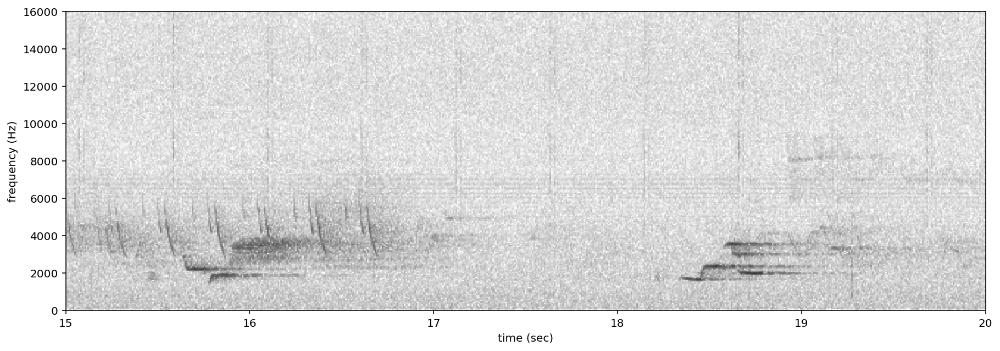

score for Wood Thrush class [0-1]: 0.161


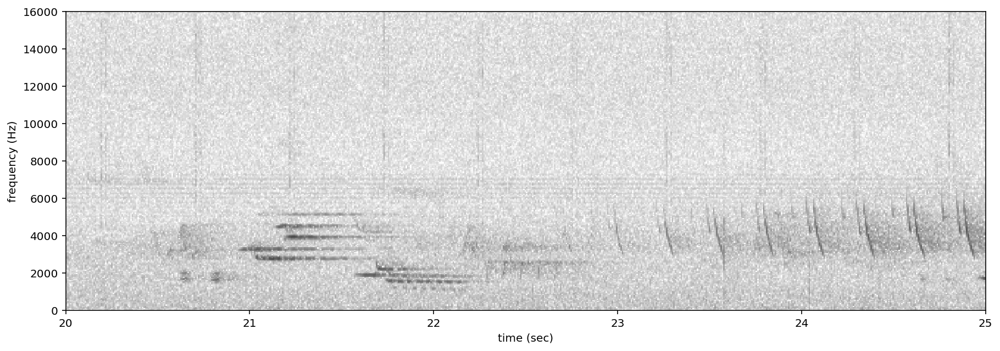

score for Wood Thrush class [0-1]: 1.000


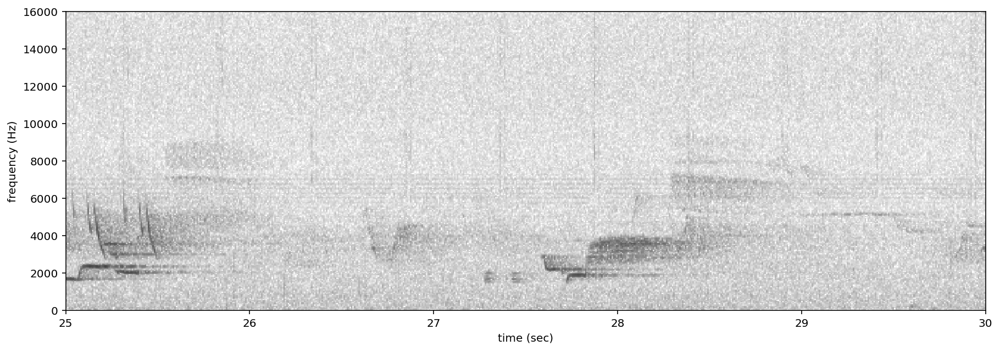

score for Wood Thrush class [0-1]: 1.000


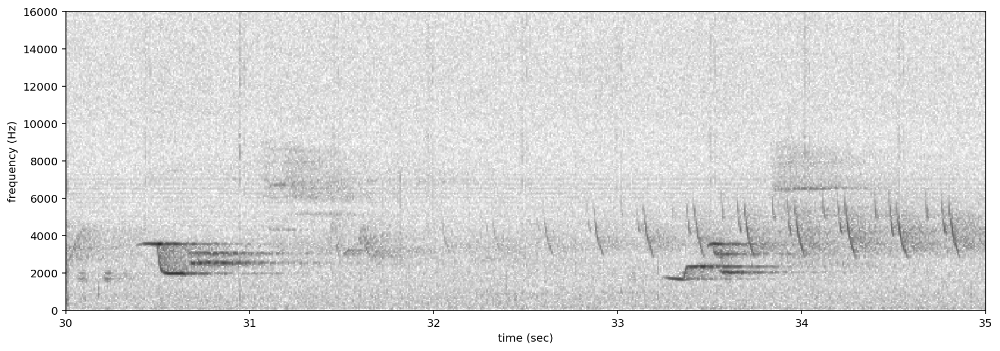

score for Wood Thrush class [0-1]: 1.000


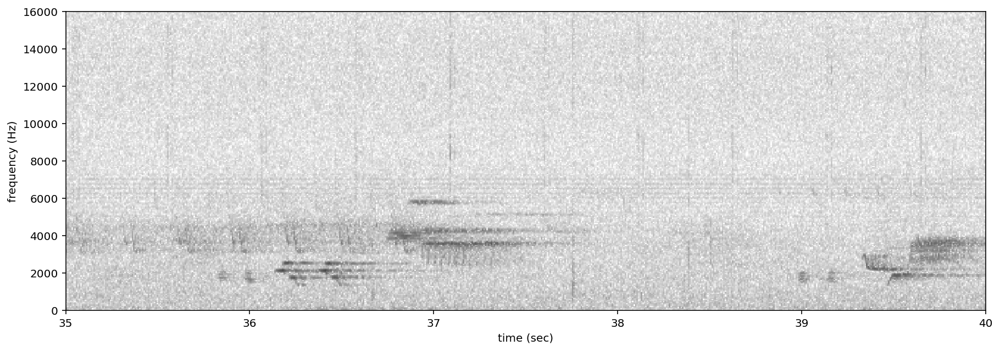

score for Wood Thrush class [0-1]: 0.000


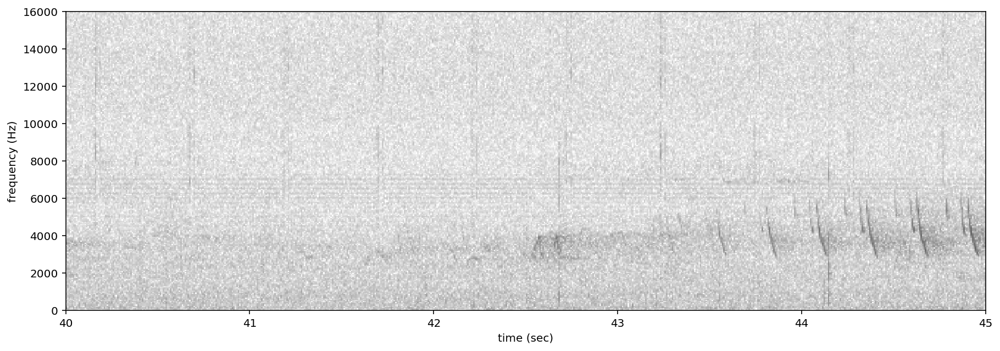

score for Wood Thrush class [0-1]: 0.006


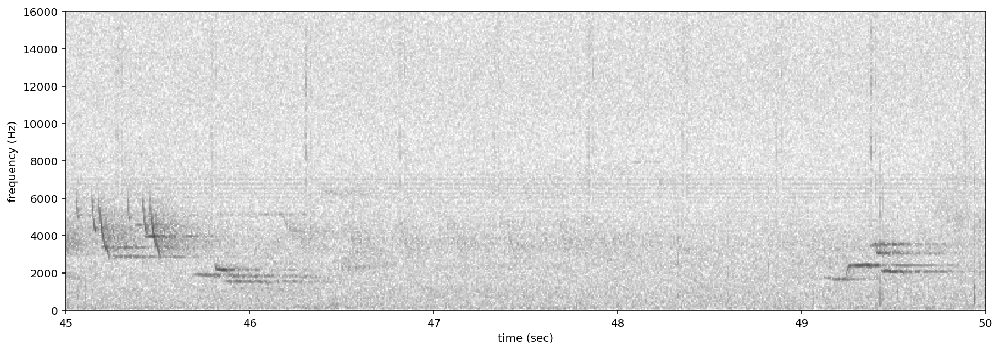

In [ ]:
for (file,clip_start_time,clip_end_time), row in preds.head(10).iterrows():
  print(f"score for Wood Thrush class [0-1]: {row['Wood Thrush']:0.3f}")
  spectrogram.trim(clip_start_time,clip_end_time).plot()

Examine other high scores

First, let's print the max score for each species in the entire audio file

In [ ]:
np.round(preds.max()[preds.max()>0.1],3)

Northern Cardinal     1.000
Eastern Wood-pewee    0.761
Kentucky Warbler      0.994
Wood Thrush           1.000
Ovenbird              0.839
Red-eyed Vireo        0.239
dtype: float32

Now let's look at clips that scored over 0.1 for a species of our choice:

score for Ovenbird class [0-1]: 0.839


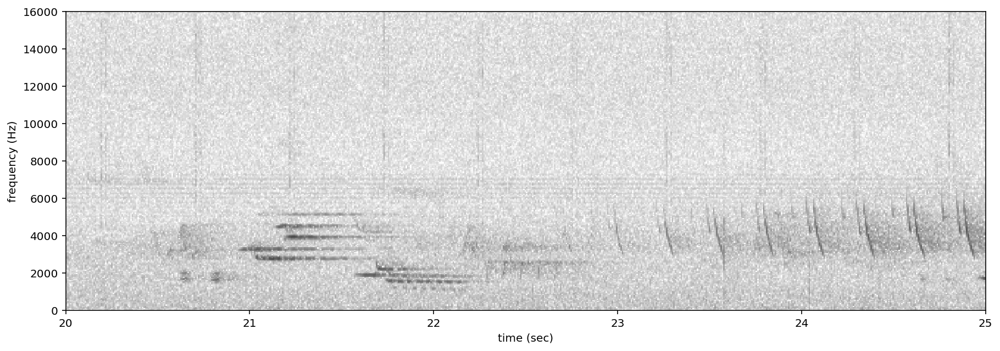

score for Ovenbird class [0-1]: 0.581


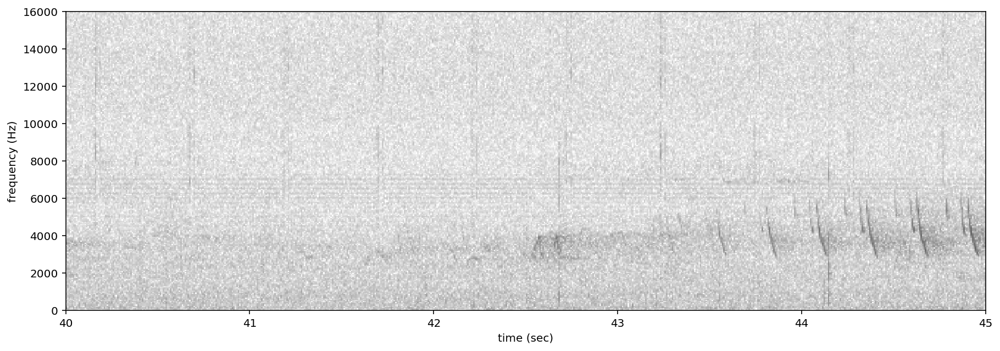

In [ ]:
species = "Ovenbird"
for (file,clip_start_time,clip_end_time), row in preds.iterrows():
  if row[species]>0.1:
    print(f"score for {species} class [0-1]: {row[species]:0.3f}")
    spectrogram.trim(clip_start_time,clip_end_time).plot()

Repeat this analysis with a species of your choice (The text you type must exactly match one of the species names in the model, including capitalization and punctuation). See the list below for all options.

In [ ]:
species = "Enter Species Name Here"
for (file,clip_start_time,clip_end_time), row in preds.iterrows():
  if row[species]>0.1:
    print(f"score for {species} class [0-1]: {row[species]:0.3f}")
    spectrogram.trim(clip_start_time,clip_end_time).plot()

List of all classes included in this model:

In [ ]:
model.classes

['Red-winged Blackbird',
 'Tufted Titmouse',
 'Cedar Waxwing',
 'Canada Goose',
 'Red-Shouldered Hawk',
 'Northern Cardinal',
 'Verry',
 'Hermit Thrush',
 "Swainson's Thrush",
 'Brown Creeper',
 'Yellow-bellied Cuckoo',
 'Northern Flicker',
 'Eastern Wood-pewee',
 'American Crow',
 'Common Raven',
 'Blue Jay',
 'Downy Woodpecker',
 'Pileated Woodpecker',
 'Kentucky Warbler',
 'Common Yellowthroat',
 'Wood Thrush',
 'Baltimore Oriole',
 'Nashville Warbler',
 'Hairy Woodpecker',
 'Red-bellied Woodpecker',
 'Wild Turkey',
 'Black-and-white Warbler',
 'Brown-headed Cowbird',
 'Louisiana Waterthrush',
 'Rose-breasted Grosbeak',
 'Eastern Towhee',
 'Scarlet Tanager',
 'Black-capped Chickadee',
 'Blue-gray Gnatcatcher',
 'Ruby-crowned Kinglet',
 'Ovenbird',
 'Hooded Warbler',
 'Blackburnian Warbler',
 'Chestnut-sided Warbler',
 'American Redstart',
 'Black-throated Green Warbler',
 'White-breasted Nuthatch',
 'American Goldfinch',
 'Carolina Wren',
 'American Robin',
 'Blue-winged Warbler',
 